# Test uniformity of Ronchi 400 grating with Halpha filter scanning
==================================================================================================

- author : Jérémy Neveu
- date   : June 9th 2017


In [1]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

ScanRon400_Halpha
ccdproc version 1.2.0
bottleneck version 1.2.0
/Users/jneveu/Documents/LSST/Calibration/CTIOAnaJun2017/ana_09jun17/ScanHoloPhP_Halpha


### Input directory

In [3]:
inputdir="../OverScanRemove/trim_images"
#inputdir="../../data/CTIODataJune2017_reducedRed/data_09jun17/"
MIN_IMGNUMBER=156
MAX_IMGNUMBER=180
date = "20170609"
tag = "trim"
holo_name = "Ron400"
object_name='HD111980'
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

### Output directories

In [4]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./cut_fitsimages"
ensure_dir(outputdir)

## Location of the spectra
----------------------------------

In [5]:
dirlist_all = [inputdir]
sorted_numbers,sorted_files = MakeFileList(dirlist_all,MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


### Show images

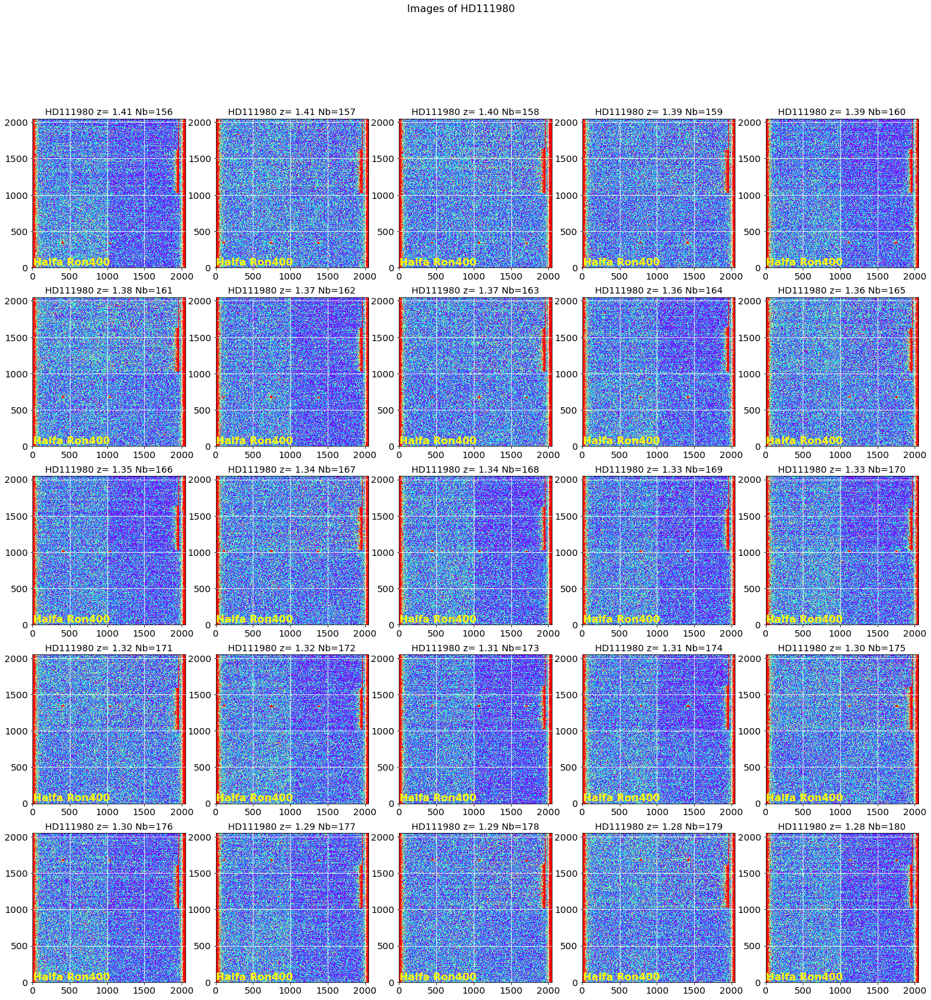

In [9]:
ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=20,downsampling=1,verbose=False)

figfilename=os.path.join(dir_top_images,'input_images.pdf')
plt.savefig(figfilename)   

### Show histograms

Processing image 0...
Processing image 1...
Processing image 2...
Processing image 3...
Processing image 4...
Processing image 5...
Processing image 6...
Processing image 7...
Processing image 8...
Processing image 9...
Processing image 10...
Processing image 11...
Processing image 12...
Processing image 13...
Processing image 14...
Processing image 15...
Processing image 16...
Processing image 17...
Processing image 18...
Processing image 19...
Processing image 20...
Processing image 21...
Processing image 22...
Processing image 23...
Processing image 24...


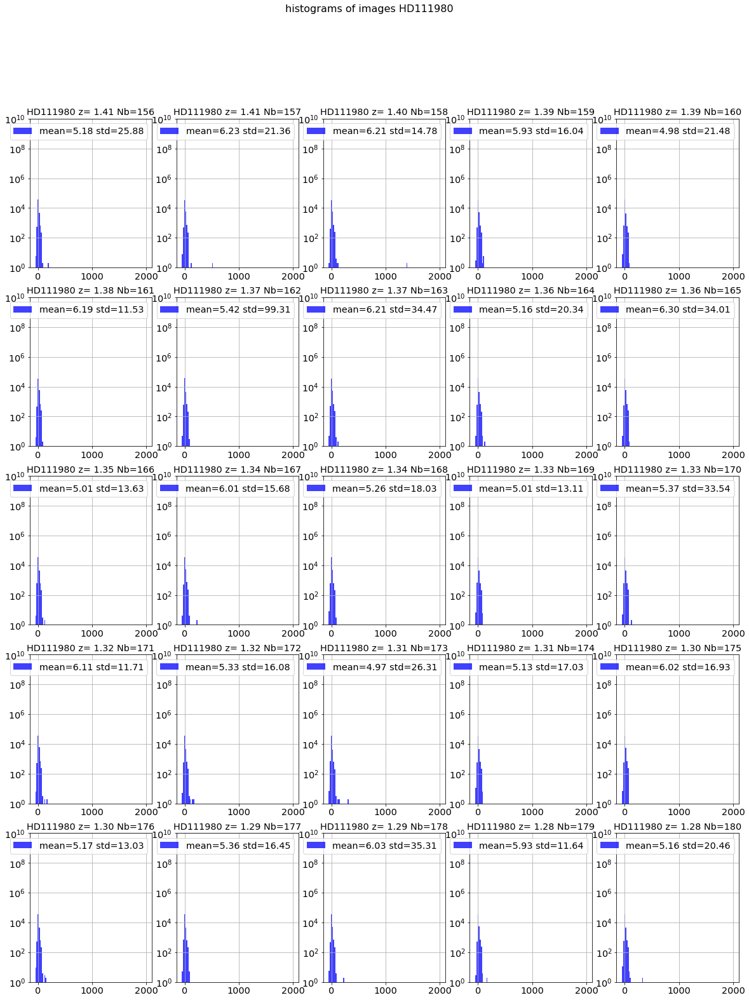

In [10]:
ShowHistograms(all_images,all_titles,all_filt,object_name,
               NBIMGPERROW=5,bins=100,range=(-50,2000),downsampling=10,verbose=True)

### Cut the images

To extract the spectra to analyze

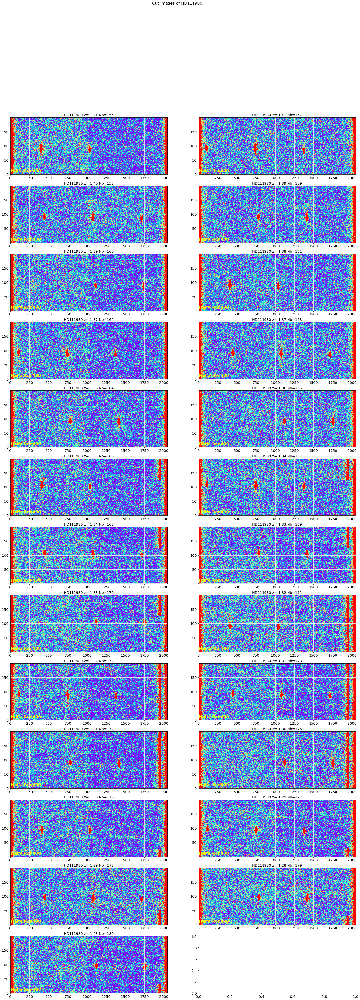

In [6]:
x_guess = [398,  740, 1076, 1403, 1741]*5
y_guess = [[350]*5, [680]*5, [1000]*5, [1350]*5, [1680]*5]
y_guess = [val for sublist in y_guess for val in sublist]
DeltaY=[100]*len(all_images)
DeltaX=[2000]*len(all_images)  # must be very large to be able to compute incident angle

images_raw=ShowCenterImages(x_guess,y_guess,DeltaX,DeltaY,all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=20)
figfilename=os.path.join(dir_top_images,'cut_images.pdf')
plt.savefig(figfilename)   

### Save cut images

In [7]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[-1]
    print short_infilename
    short_partfilename=re.findall('^%s_(.*)' % tag,short_infilename)
    short_outfilename='cutimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)
    
for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_raw[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,overwrite=True)

trim_20170609_156.fits
trim_20170609_157.fits
trim_20170609_158.fits
trim_20170609_159.fits
trim_20170609_160.fits
trim_20170609_161.fits
trim_20170609_162.fits
trim_20170609_163.fits
trim_20170609_164.fits
trim_20170609_165.fits
trim_20170609_166.fits
trim_20170609_167.fits
trim_20170609_168.fits
trim_20170609_169.fits
trim_20170609_170.fits
trim_20170609_171.fits
trim_20170609_172.fits
trim_20170609_173.fits
trim_20170609_174.fits
trim_20170609_175.fits
trim_20170609_176.fits
trim_20170609_177.fits
trim_20170609_178.fits
trim_20170609_179.fits
trim_20170609_180.fits


In [8]:
!ls -l cut_fitsimages/*

-rw-r--r--  1 jneveu  staff  3288960 11 aoû 14:29 cut_fitsimages/cutimg_20170609_156.fits
-rw-r--r--  1 jneveu  staff  3288960 11 aoû 14:29 cut_fitsimages/cutimg_20170609_157.fits
-rw-r--r--  1 jneveu  staff  3288960 11 aoû 14:29 cut_fitsimages/cutimg_20170609_158.fits
-rw-r--r--  1 jneveu  staff  3288960 11 aoû 14:29 cut_fitsimages/cutimg_20170609_159.fits
-rw-r--r--  1 jneveu  staff  3288960 11 aoû 14:29 cut_fitsimages/cutimg_20170609_160.fits
-rw-r--r--  1 jneveu  staff  3288960 11 aoû 14:29 cut_fitsimages/cutimg_20170609_161.fits
-rw-r--r--  1 jneveu  staff  3288960 11 aoû 14:29 cut_fitsimages/cutimg_20170609_162.fits
-rw-r--r--  1 jneveu  staff  3288960 11 aoû 14:29 cut_fitsimages/cutimg_20170609_163.fits
-rw-r--r--  1 jneveu  staff  3288960 11 aoû 14:29 cut_fitsimages/cutimg_20170609_164.fits
-rw-r--r--  1 jneveu  staff  3288960 11 aoû 14:29 cut_fitsimages/cutimg_20170609_165.fits
-rw-r--r--  1 jneveu  staff  3288960 11 aoû 14:29 cut_fitsimages/cutimg_20170609_166.fits
-rw-r--r--

# Find the optimal rotation of the spectra
============================

In [9]:
inputdir="./cut_fitsimages"
SelectTagRe='^cutimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^cutimg_%s_[0-9]+.fits$' % date

outputdir="./rotated_fitsimages"
ensure_dir(outputdir)

In [10]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


## Find rotation by Hessian analysis

La méthode s'inspire des techniques de détection de filmanents dans le milieu interstellaire.
Elle est décrite dans https://arxiv.org/pdf/1409.6728.pdf section 4.1.
Documentation sur le calcul du Hessien : http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.hessian_matrix

### Test rotation optimal settings

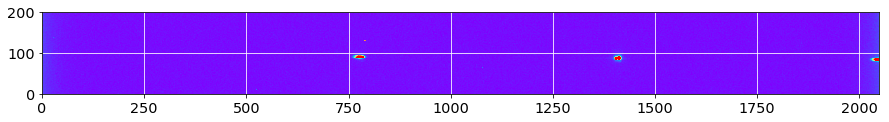

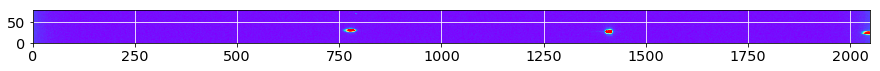

In [11]:
sel=3
image_sel=np.copy(all_images[sel])
y0=DeltaY[sel]
x0=x_guess[sel]

width_cut = 40
right_edge = IMSIZE

plt.imshow(image_sel,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

region=np.copy(image_sel[y0-width_cut:y0+width_cut,0:right_edge])
data=np.copy(region)
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

In [12]:
# le paramètre sigma permet de lisser le hessien
Hxx, Hxy, Hyy = hessian_matrix(data, sigma=3, order = 'xy')
lambda_plus = 0.5*( (Hxx+Hyy) + np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
lambda_minus = 0.5*( (Hxx+Hyy) - np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
theta = 0.5*np.arctan2(2*Hxy,Hyy-Hxx)*180/np.pi

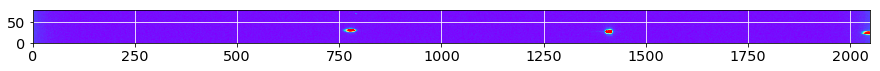

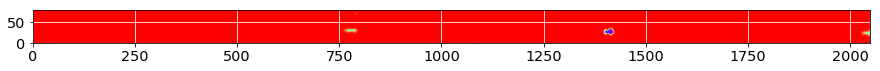

In [13]:
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()
plt.imshow(lambda_minus,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='white', ls='solid')
plt.show()

Number of remaining pixels : 710


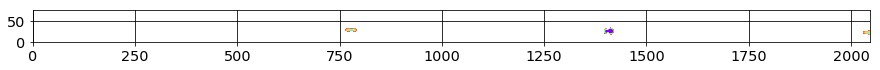

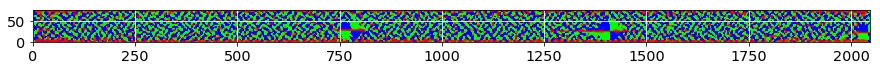

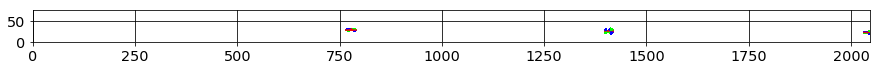

In [14]:
lambda_threshold = -10
margin_cut = 1

lambda_minus = lambda_minus[margin_cut:-margin_cut,margin_cut:-margin_cut]
lambda_plus = lambda_plus[margin_cut:-margin_cut,margin_cut:-margin_cut]
theta = theta[margin_cut:-margin_cut,margin_cut:-margin_cut]

mask = np.where(lambda_minus>lambda_threshold)
lambda_mask = np.copy(lambda_minus)
lambda_mask[mask]=np.nan

theta_mask = np.copy(theta)
theta_mask[mask]=np.nan

print 'Number of remaining pixels :',len(lambda_mask[~np.isnan(lambda_mask)])

plt.imshow(lambda_mask,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='black', ls='solid')
plt.show()

plt.imshow(theta,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='white', ls='solid')
plt.show()

plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='black', ls='solid')
plt.show()

Number of remaining pixels : 319


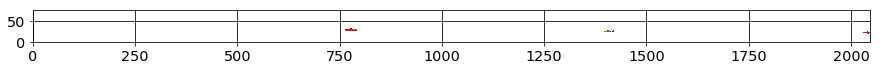

In [15]:
deg_threshold = 20

mask2 = np.where(np.abs(theta)>deg_threshold)
theta_mask[mask2] = np.nan
print 'Number of remaining pixels :',len(theta_mask[~np.isnan(theta_mask)])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.grid(color='black', ls='solid')
plt.show()

Angle median : -0.0724931188992


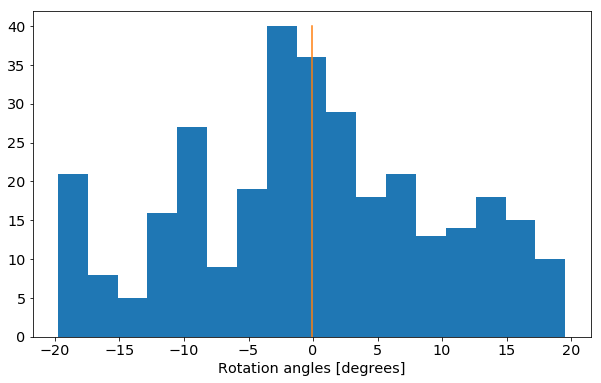

In [16]:
theta_hist = []
theta_hist = theta_mask[~np.isnan(theta_mask)].flatten()
theta_median = np.median(theta_hist)
print 'Angle median :',theta_median
fig = plt.figure(figsize=(10,6))
n,bins, patches = plt.hist(theta_hist,bins=int(np.sqrt(len(theta_hist))))
plt.plot([theta_median,theta_median],[0,np.max(n)])
plt.xlabel("Rotation angles [degrees]")
plt.show()

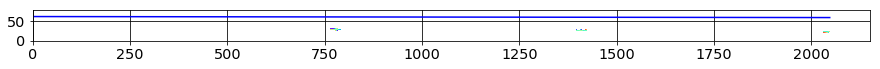

In [17]:
xindex=np.arange(data.shape[1])
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = y0 - width_cut + (x_new-x0)*np.tan(theta_median*np.pi/180.)
plt.imshow(theta_mask,origin='lower',cmap='rainbow',vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()

On peut aussi essayer de fitter le spectre qui a été détecté par la méthode ci-dessus.

Rotation angle from fit : -0.288216427787


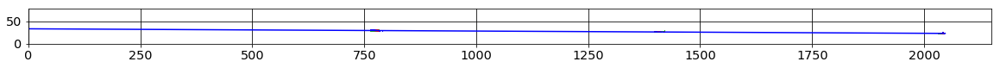

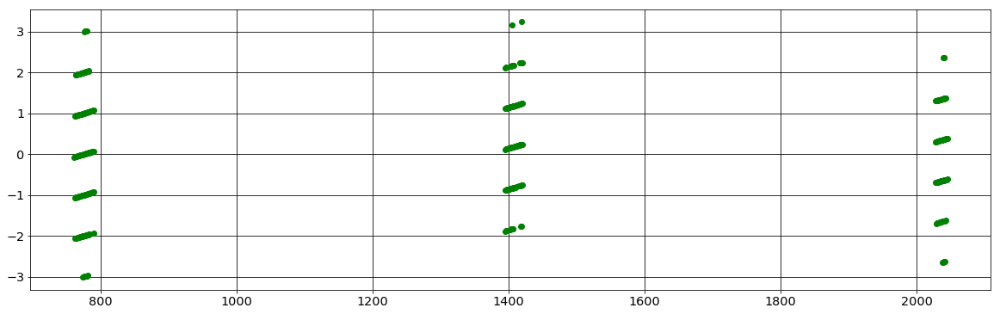

In [18]:
xtofit=[]
ytofit=[]
for iy,y in enumerate(theta_mask):
    for ix,x in enumerate(y):
        if not np.isnan(theta_mask[iy][ix]) :
            if np.abs(theta_mask[iy][ix])>deg_threshold : continue
            xtofit.append(ix)
            ytofit.append(iy)
popt, pcov = fit_line(xtofit, ytofit)
[a, b] = popt
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = line(x_new,a,b)
print 'Rotation angle from fit :',np.arctan(a)*180/np.pi
fig = plt.figure(figsize=[20,6])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()
fig = plt.figure(figsize=[20,6])
diff = []
for ix,x in enumerate(xtofit):
    diff.append(ytofit[ix]-line(x,a,b))
plt.plot(xtofit,diff,'go')
plt.grid(color='black', ls='solid')
plt.show()

0  theta =  -0.306072052755
1  theta =  -0.266650972356
2  theta =  -0.271001341247
3  theta =  -0.239501455539
4  theta =  -0.238126551615
5  theta =  -0.26699877128
6  theta =  -0.274437450027
7  theta =  -0.278333979194
8  theta =  -0.246115763568
9  theta =  -0.253216189757
10  theta =  -0.25261232652
11  theta =  -0.270037942202
12  theta =  -0.27130187576
13  theta =  -0.275908686076
14  theta =  -0.276127449486
15  theta =  -0.254777715214
16  theta =  -0.285459611527
17  theta =  -0.277288784299
18  theta =  -0.295357176663
19  theta =  -0.289051968871
20  theta =  -0.236250109489
21  theta =  -0.282019612038
22  theta =  -0.271091869007
23  theta =  -0.322988261121
24  theta =  -0.315692686354


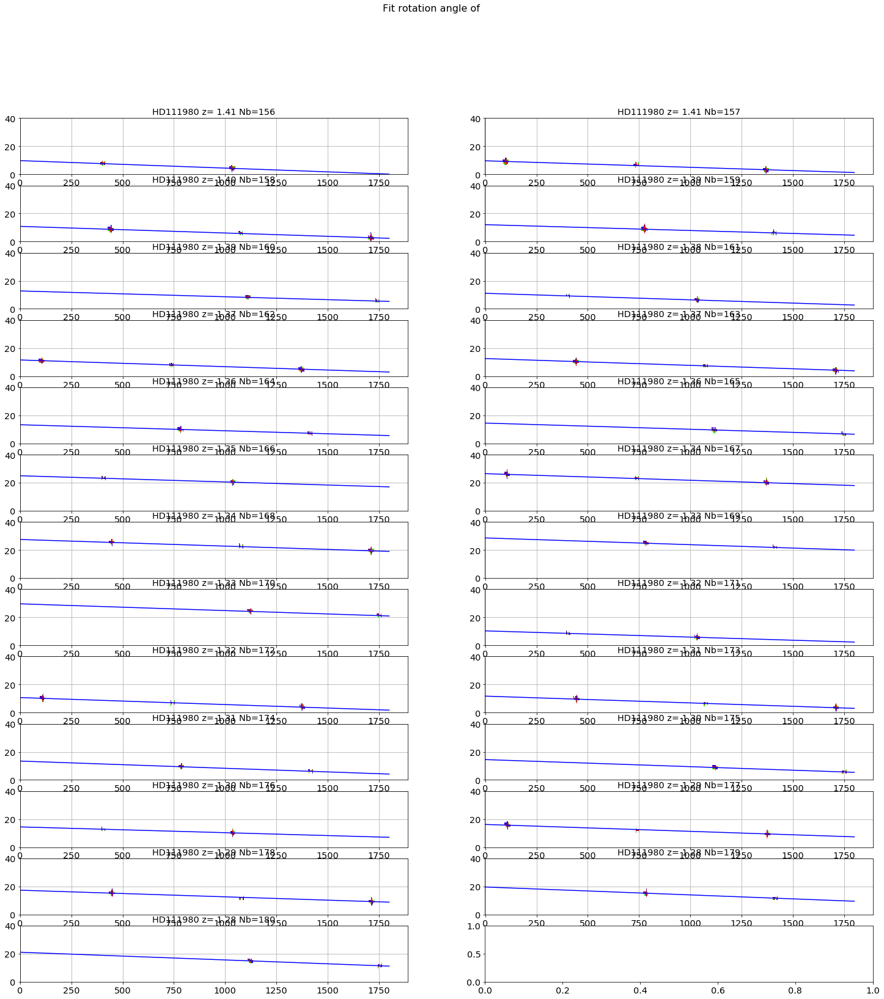

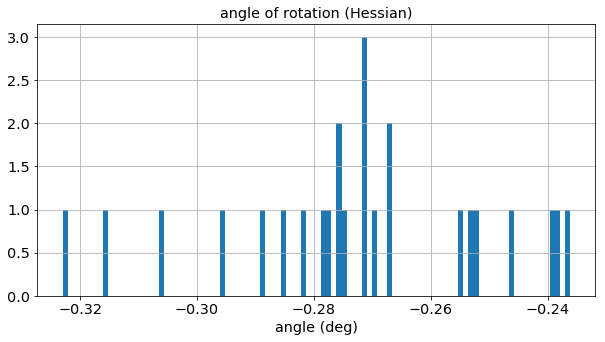

In [19]:
all_theta=ComputeRotationAngleHessianAndFit(all_images,x_guess,DeltaY,all_titles,object_name, 
   NBIMGPERROW=2, lambda_threshold = -10, deg_threshold = 10, width_cut = 20, right_edge = 1800, margin_cut=1)
figfilename=os.path.join(dir_top_images,'fit_rotation.pdf')
plt.savefig(figfilename)  

for index in range(len(all_theta)):
    print index,' theta = ',all_theta[index]
plt.figure(figsize=(10,5))
n, bins, patches=plt.hist(all_theta,bins=100,histtype='stepfilled')
plt.grid(True)
plt.title('angle of rotation (Hessian)')
plt.xlabel('angle (deg)')

### Turn the images accordingly

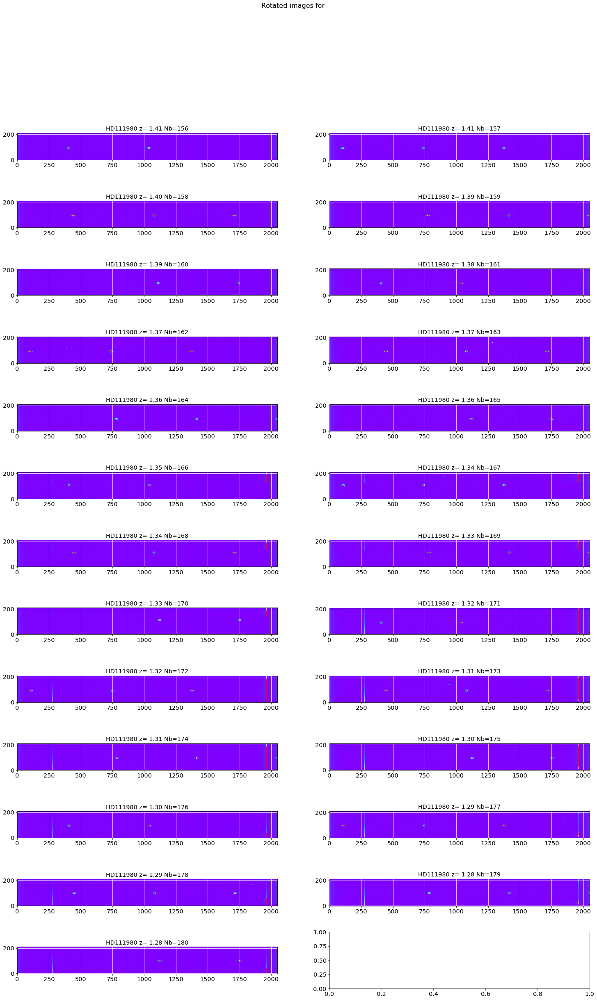

In [20]:
turned_images=TurnTheImages(all_images,all_theta,all_titles,object_name,NBIMGPERROW=2,
                            oversample_factor=1) 
figfilename=os.path.join(dir_top_images,'rotated_images.pdf')
plt.savefig(figfilename)  

### Check rotation

In case of bad rotation, check by eye

array([-0.0084002 , -0.00269525, -0.00576663, -0.0061671 , -0.00149703,
       -0.0086392 , -0.00389536, -0.0009782 , -0.01300532, -0.02709533,
       -0.0192937 , -0.00523851, -0.00516371, -0.00133185, -0.01431077,
       -0.00104206,  0.00424248, -0.00362114, -0.00632981,  0.00065701,
        0.01037765,  0.00257452, -0.00268769, -0.00305462, -0.00843442])

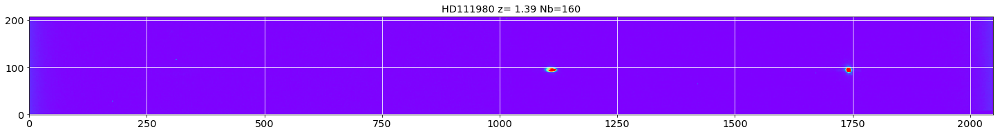

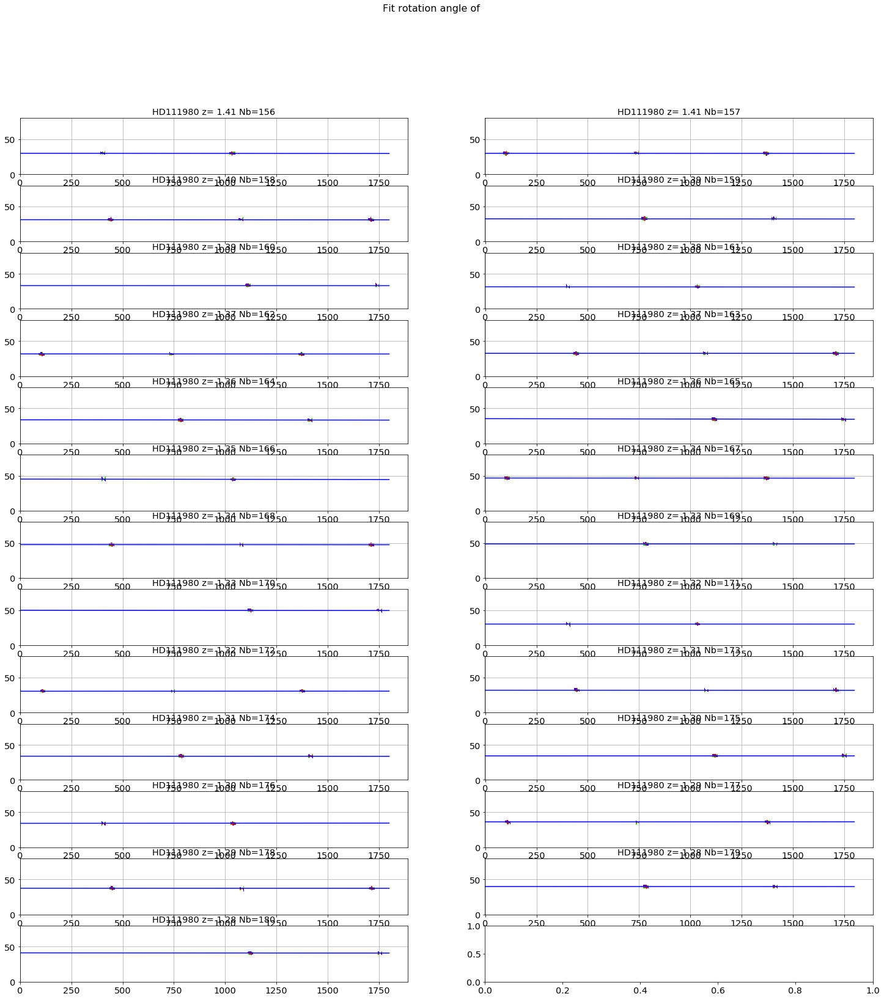

In [21]:
sel=4
plt.figure(figsize=(25,10))
plt.imshow(turned_images[sel],origin='lower',cmap='rainbow',vmin=0,vmax=1000)
plt.grid(True)
plt.title(all_titles[sel])
plt.grid(color='white', ls='solid')
figfilename=os.path.join(dir_top_images,'rotated_image_sample.pdf')
plt.savefig(figfilename)  

ComputeRotationAngleHessianAndFit(turned_images,x_guess,DeltaY,all_titles,object_name, 
            NBIMGPERROW=2, lambda_threshold = -10, deg_threshold = 20, width_cut = 40, right_edge = 1800)

Cut the extra spectra that pollute the images.

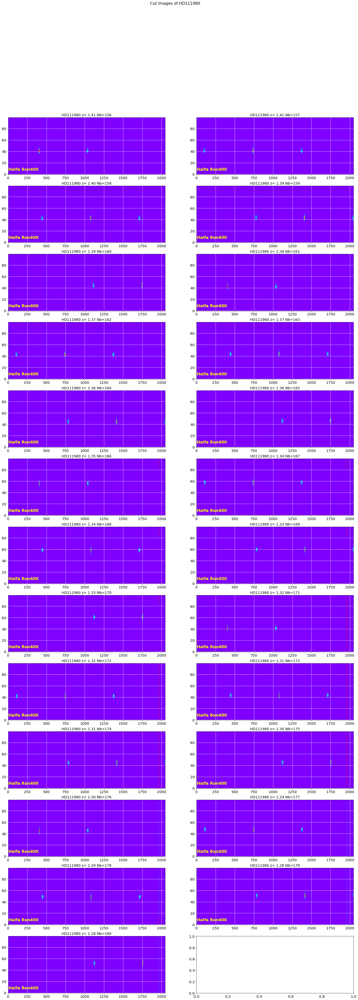

In [22]:
DeltaY_rot2 = [50]*len(all_images)
y_guess_rot2 = [100]*len(all_images)
images_cut_rot=ShowCenterImages(x_guess,y_guess_rot2,DeltaX,DeltaY_rot2,
                    turned_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=5000) 

# Find the central star locations
======================================

### Central star positions after rotation

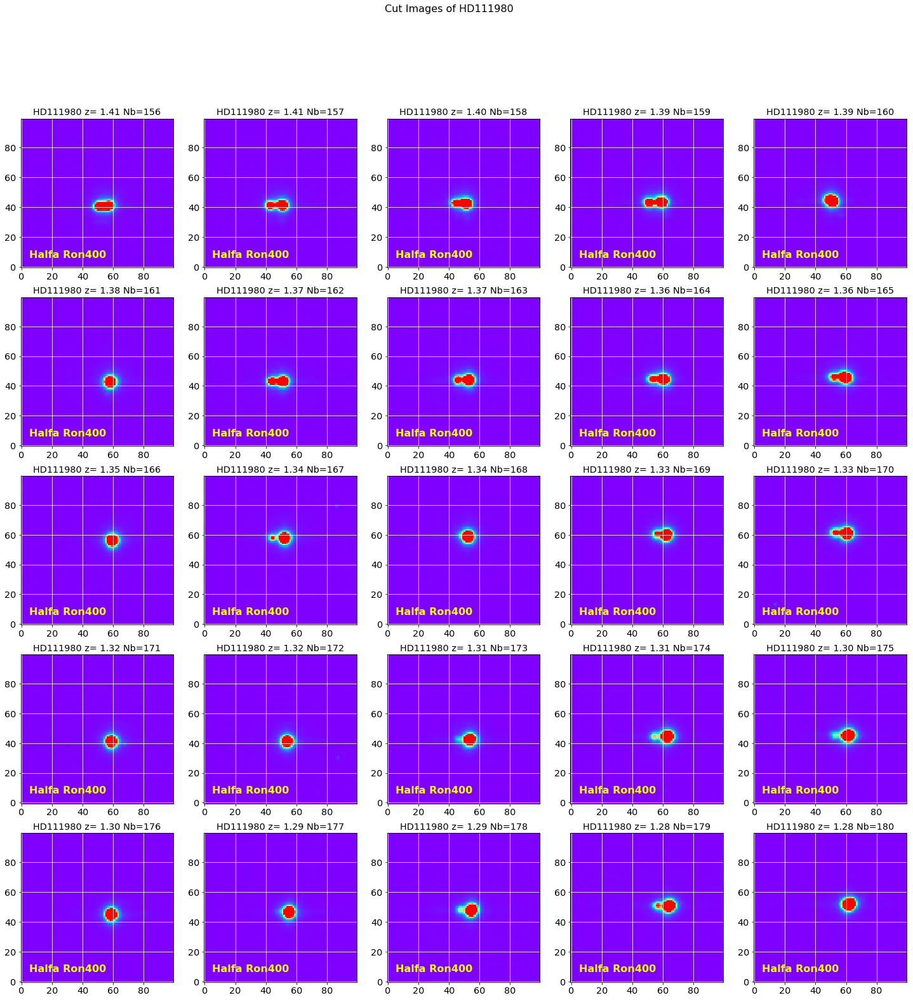

In [23]:
x_guess_rot = x_guess
y_guess_rot = DeltaY_rot2
DeltaY_rot = [50]*len(all_images)
DeltaX_rot = [50]*len(all_images)

images_cut=ShowCenterImages(x_guess_rot,y_guess_rot,DeltaX_rot,DeltaY_rot,
                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

In [24]:
# (JN) valeurs optimisées pour cette étude
img_mean,img_median,img_std,img_sources=ComputeStatImages(images_cut,fwhm=5,threshold=200,sigma=10.0,iters=5)

----------------------------------------------------------------
0  mean, median, std =  11.0639990057 7.38799886405 18.5918393041
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- ------------- --------------
  1 51.3282906628 40.6328102629 ...  11252.385666 3.75434258632  -1.4363347494
  2 56.0149644096 40.8697417085 ... 14846.7620491 5.02879059278 -1.75365887813
----------------------------------------------------------------
1  mean, median, std =  11.2666289718 6.94272157342 22.9347756915
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- ------------- --------------
  1 43.0221106423 41.1545856201 ... 8812.31199944 2.67994937955 -1.07031647725
  2 50.8394830269  41.127793966 ... 19900.9075774 6.11189134689  -1.9654390626
----------------------------------------------------------------
2  mean, median, std =  10.6210136957 6.7

        Use DAOStarFinder instead. [astropy.utils.decorators]


----------------------------------------------------------------
9  mean, median, std =  10.2446937366 5.9073506076 23.9756006114
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- ------------- --------------
  1 59.7907175578 45.3065666587 ... 20644.9872105 5.96769557512 -1.93951665185
----------------------------------------------------------------
10  mean, median, std =  9.70225126843 6.29462323351 18.0941837699
 id   xcentroid     ycentroid   ...     peak          flux          mag      
--- ------------- ------------- ... ------------ ------------- --------------
  1 59.0208721367 56.0260832428 ... 28727.130068 11.4804381558 -2.64989615852
----------------------------------------------------------------
11  mean, median, std =  10.509892908 6.51417875376 21.6998722942
 id   xcentroid     ycentroid   ...      peak         flux          mag      
--- ------------- ------------- ... ------------- --------

### Central star position

It seems that the correct central star is the right one.

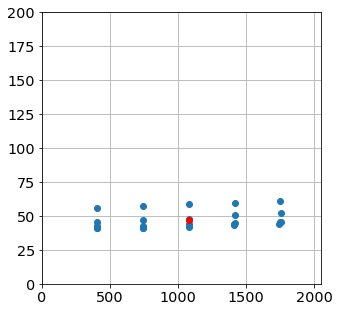

In [25]:
x_star = []
y_star = []
for index,s in enumerate(img_sources):
    thestar = None
    test = -1
    for ss in s:
        if ss['xcentroid'] > test :
            test = ss['xcentroid']
            thestar = ss
    x_star.append(thestar['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
    y_star.append(thestar['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])
        
x_mean = np.mean(x_star)
y_mean = np.mean(y_star)
img_size=all_images[0].shape
plt.figure(figsize=(5,5))
plt.plot(x_star,y_star,'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,img_size[1])
plt.ylim(0,img_size[0])
plt.grid(True)

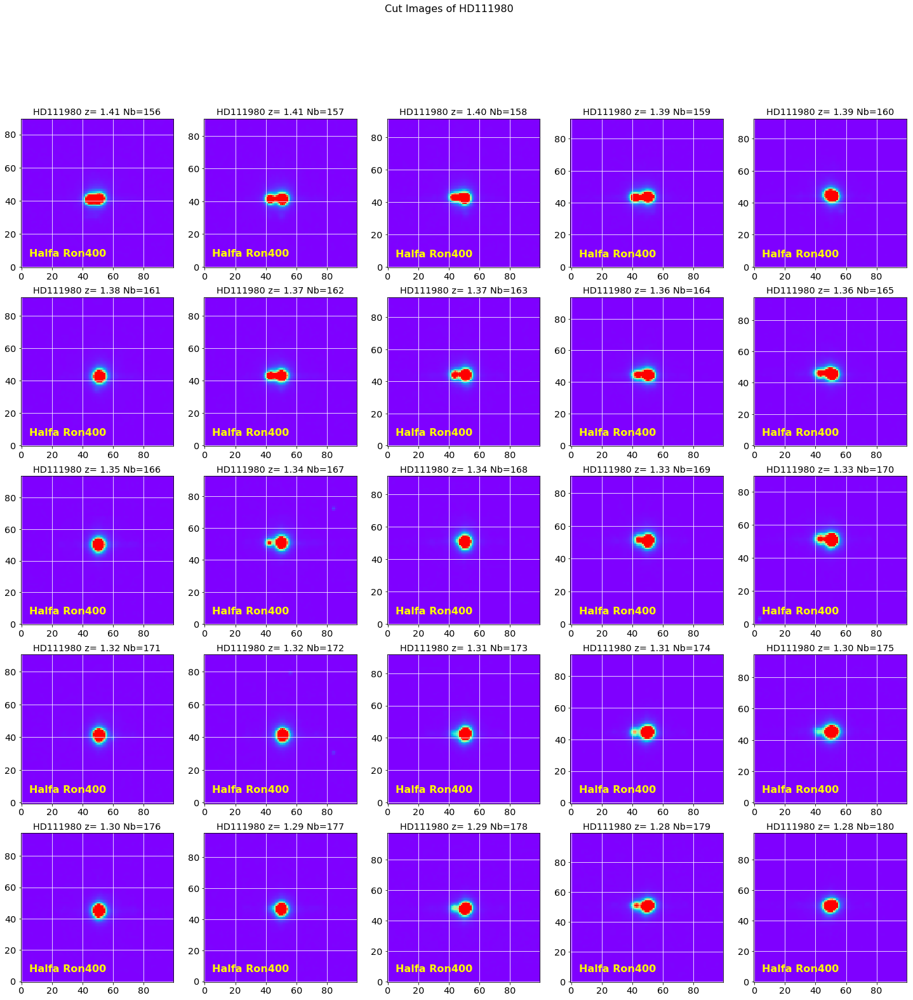

In [26]:
images_cut=ShowCenterImages(x_star,y_star,DeltaX_rot,DeltaY_rot,
                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

## Pointing positions before rotations

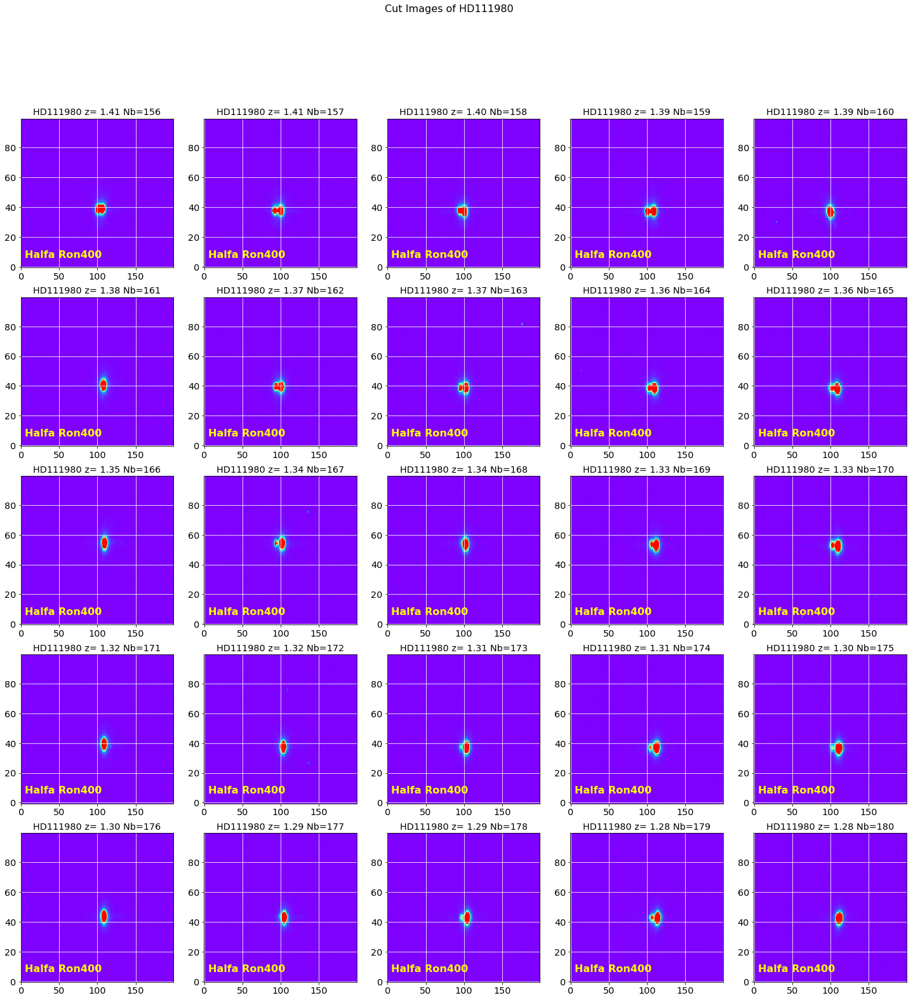

In [27]:
DeltaY_rot = [50]*len(all_images)
DeltaX_rot = [100]*len(all_images)
images_raw_cut=ShowCenterImages(x_guess,DeltaY,DeltaX_rot,DeltaY_rot,
                    images_raw,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

In [28]:
# (JN) valeurs optimisées pour cette étude
img_mean,img_median,img_std,img_sources=ComputeStatImages(images_raw_cut,fwhm=5,threshold=200,sigma=10.0,iters=5)

----------------------------------------------------------------
0  mean, median, std =  7.61505408958 7.0 9.50541044175
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 100.433975817 38.4639445566 ... 14812.0 9.63211972029 -2.45930467978
  2 105.588452225 38.7143229065 ... 18596.0 12.7213669523 -2.76133445044
----------------------------------------------------------------
1  mean, median, std =  7.34261458386 6.0 10.4335814884
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 100.297018282 37.4521469326 ... 24897.0 16.0746587208 -3.01535440309
  2 92.3971586965 37.4944993959 ... 10902.0  7.0446469346 -2.11964807978
----------------------------------------------------------------
2  mean, median, std =  6.84673709751 6.0 9.67390074387
 id   xcentroid     ycentroid   ...   peak       flux

[[  403.58845222   338.71432291]
 [  740.29701828   337.45214693]
 [ 1076.59929286   336.88675913]
 [ 1411.88581298   337.12061728]
 [ 1741.38202014   336.44635198]
 [  405.17075258   670.23116369]
 [  740.58326487   669.09728455]
 [ 1078.21130595   668.45445477]
 [ 1413.04937504   668.08683112]
 [ 1750.22520569   667.60308057]
 [  406.52005141  1004.23514916]
 [  741.89635514  1003.86423904]
 [ 1077.85451725  1003.36119793]
 [ 1415.0955934   1002.71288395]
 [ 1751.15622741  1002.10493919]
 [  405.9903133   1339.51974366]
 [  743.43639947  1337.77775317]
 [ 1078.97794953  1337.39051102]
 [ 1415.52552317  1337.27926912]
 [ 1752.03706557  1336.60424045]
 [  405.87743711  1673.83875532]
 [  744.69308314  1673.05448595]
 [ 1079.98113922  1672.74499546]
 [ 1416.83181986  1672.68752149]
 [ 1752.84865733  1672.53973038]]
[404.01496440956021, 740.83948302687304, 1077.1215970026967, 1412.4257914166169, 1741.8760944070605, 405.73611169133198, 741.13242629948491, 1078.7860215616922, 1413.58641995

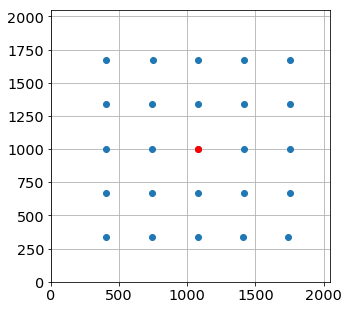

In [53]:
x_pointing = []
y_pointing = []
for index,s in enumerate(img_sources):
    thestar = None
    test = -1
    for ss in s:
        if ss['xcentroid'] > test :
            test = ss['xcentroid']
            thestar = ss
    x_pointing.append(thestar['xcentroid']+x_guess[index]-DeltaX_rot[index])
    y_pointing.append(thestar['ycentroid']+y_guess[index]-DeltaY_rot[index])
        
x_mean = np.mean(x_pointing)
y_mean = np.mean(y_pointing)
img_size=all_images[0].shape
order0_positions = np.array([x_pointing,y_pointing]).T
print order0_positions
print x_star
plt.figure(figsize=(5,5))
plt.plot(order0_positions.T[0],order0_positions.T[1],'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,IMSIZE)
plt.ylim(0,IMSIZE)
plt.grid(True)

## Save results

In [30]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[2]
    short_partfilename=re.findall('^cutimg_(.*)',short_infilename)
    short_outfilename='rotimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

In [31]:
for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_cut_rot[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)
textfilename=os.path.join(outputdir,'star_centroids.txt')
print textfilename
np.savetxt(textfilename,order0_positions,header="y_star x_star",fmt='%d')

!ls -l rotated_fitsimages

./rotated_fitsimages/star_centroids.txt
total 161208
-rw-r--r--  1 jneveu  staff  1650240 11 aoû 14:30 rotimg_20170609_156.fits
-rw-r--r--  1 jneveu  staff  1650240 11 aoû 14:30 rotimg_20170609_157.fits
-rw-r--r--  1 jneveu  staff  1650240 11 aoû 14:30 rotimg_20170609_158.fits
-rw-r--r--  1 jneveu  staff  1650240 11 aoû 14:30 rotimg_20170609_159.fits
-rw-r--r--  1 jneveu  staff  1650240 11 aoû 14:30 rotimg_20170609_160.fits
-rw-r--r--  1 jneveu  staff  1650240 11 aoû 14:30 rotimg_20170609_161.fits
-rw-r--r--  1 jneveu  staff  1650240 11 aoû 14:30 rotimg_20170609_162.fits
-rw-r--r--  1 jneveu  staff  1650240 11 aoû 14:30 rotimg_20170609_163.fits
-rw-r--r--  1 jneveu  staff  1650240 11 aoû 14:30 rotimg_20170609_164.fits
-rw-r--r--  1 jneveu  staff  1650240 11 aoû 14:30 rotimg_20170609_165.fits
-rw-r--r--  1 jneveu  staff  1650240 11 aoû 14:30 rotimg_20170609_166.fits
-rw-r--r--  1 jneveu  staff  1650240 11 aoû 14:30 rotimg_20170609_167.fits
-rw-r--r--  1 jneveu  staff  1650240 11 aoû 14:

# Extract spectra
===================================

In [32]:
outputdir="./spectrum_fitsspec"
ensure_dir(outputdir)

inputdir="./rotated_fitsimages"
SelectTagRe='^rotimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^rotimg_%s_[0-9]+.fits$' % date

In [33]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


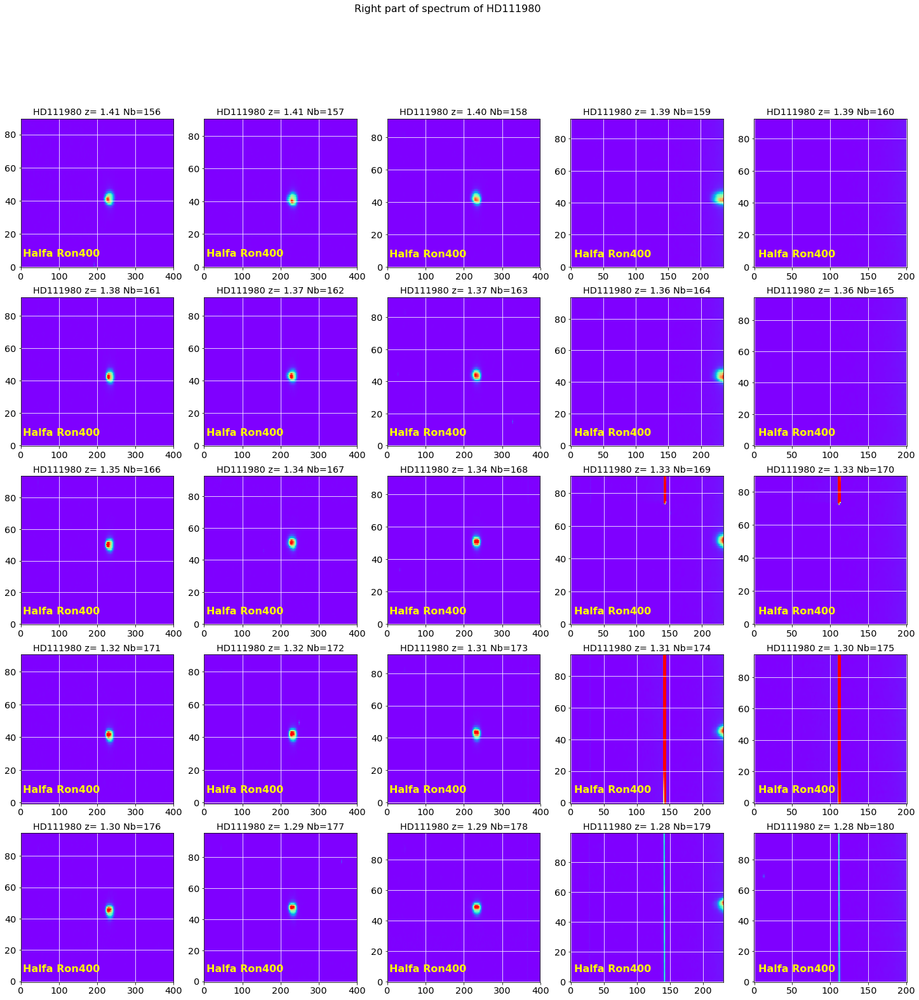

In [34]:
# Right spectrum
x_guess_right = []
for x in x_star :
    x_guess_right.append(min(IMSIZE-1,x+600))
ShowCenterImages(x_guess_right,y_star,[200]*len(all_images),[50]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
title='Right part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'rightorder.pdf')
plt.savefig(figfilename)  

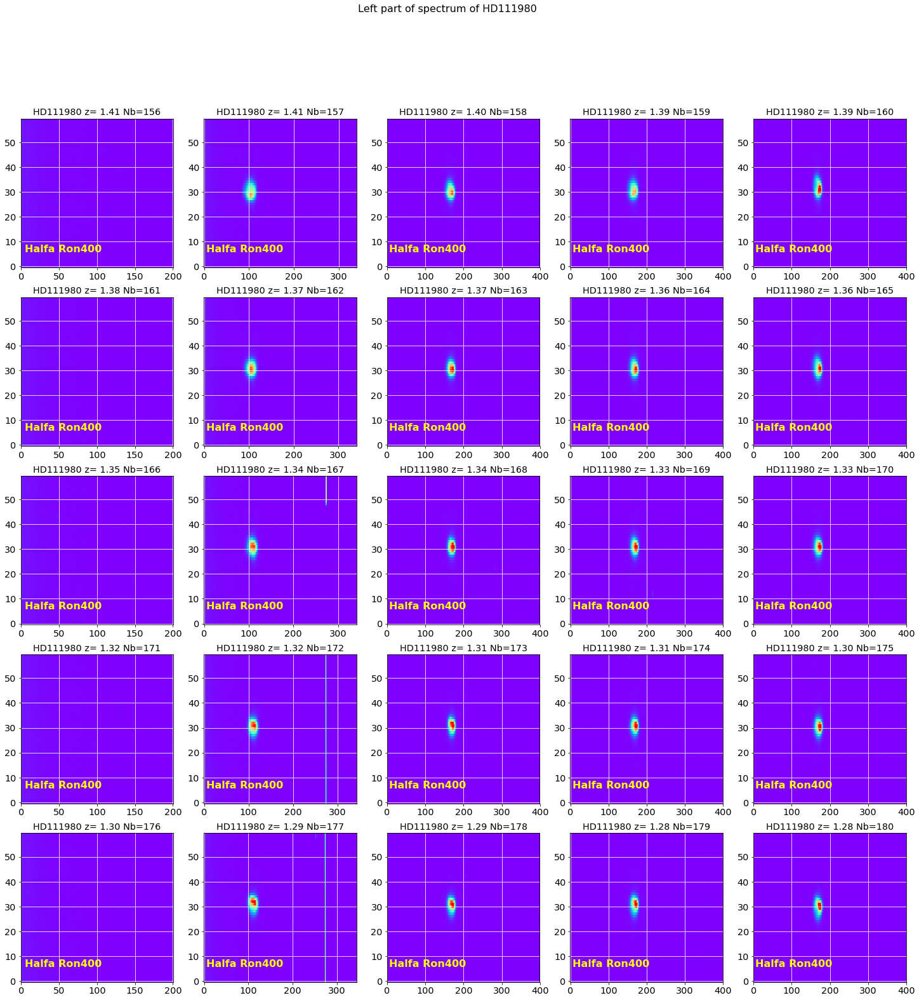

In [35]:
# Left spectrum
x_guess_left = []
for x in x_star :
    x_guess_left.append(max(1,x-600))
ShowCenterImages(x_guess_left,y_star,[200]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
title='Left part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'leftorder.pdf')
plt.savefig(figfilename)  

### Extraction

[41,
 41,
 42,
 43,
 44,
 42,
 43,
 44,
 44,
 45,
 56,
 58,
 59,
 60,
 61,
 41,
 42,
 43,
 45,
 45,
 45,
 47,
 48,
 51,
 52]

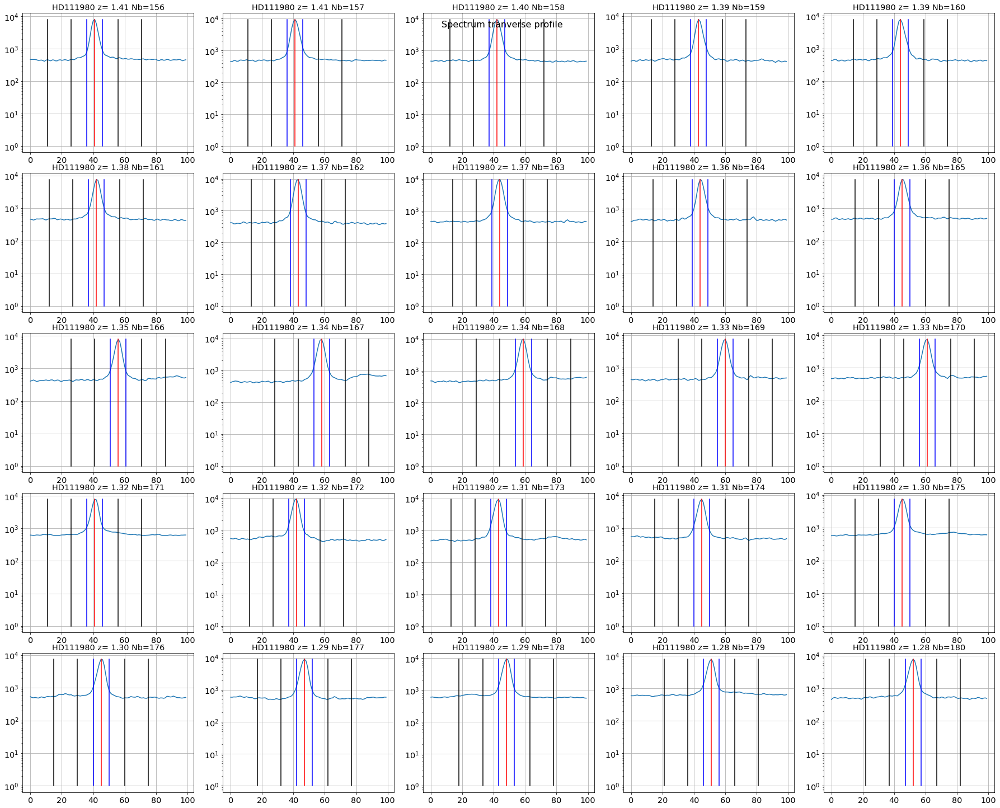

In [36]:
ShowTransverseProfile(all_images,all_titles,object_name,all_expo,NBIMGPERROW=5,DeltaX=1000,w=5,ws=[15,30],right_edge=1800)

In [37]:
thespectra,thespectraUp,thespectraDown=ExtractSpectra(y_star,all_images,all_titles,object_name,all_expo,
                                                      w=5,ws=[10,30],right_edge=IMSIZE)

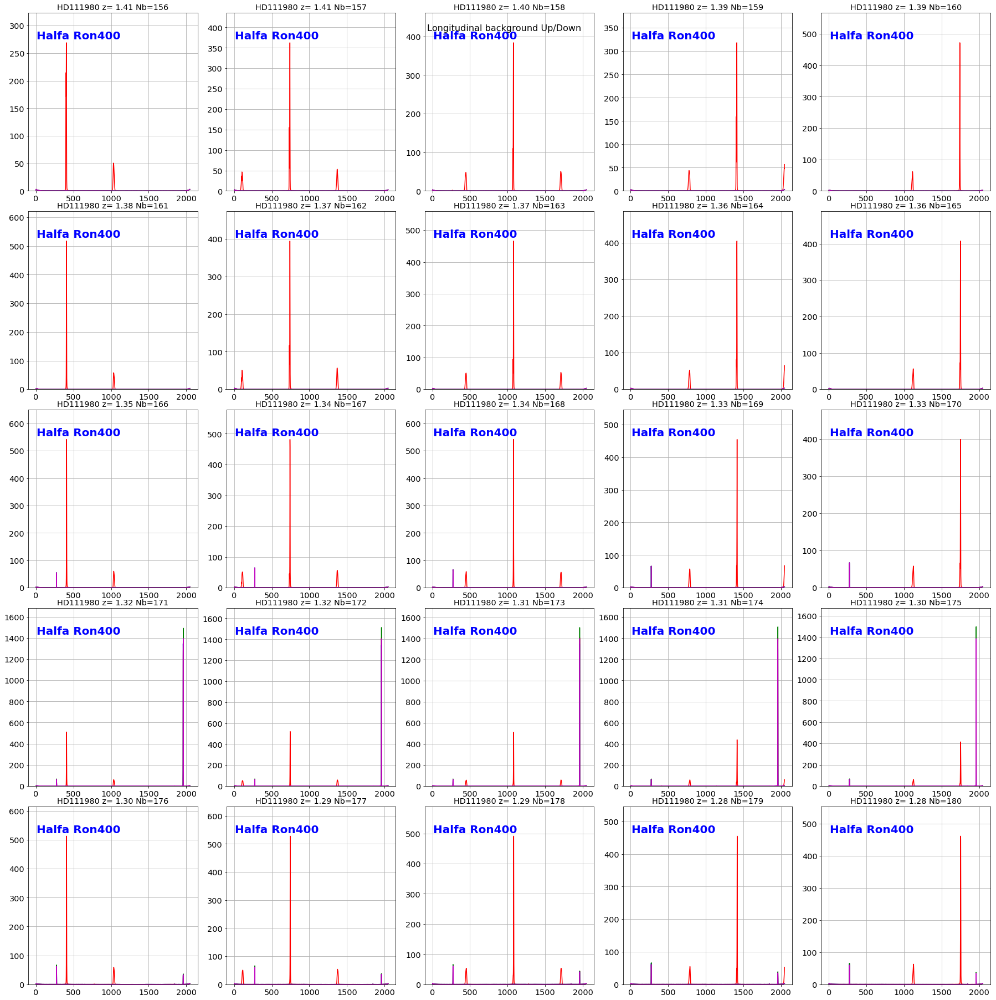

In [38]:
Clean_Up, Clean_Do,Clean_Av=CleanBadPixels(thespectraUp,thespectraDown) 

ShowLongitBackground(thespectra,Clean_Up,Clean_Do,Clean_Av,all_titles,all_filt,object_name,
                     NBIMGPERROW=5,right_edge=IMSIZE)
figfilename=os.path.join(dir_top_images,'background_longprofile.pdf')
plt.savefig(figfilename)   

(0, 200.0)

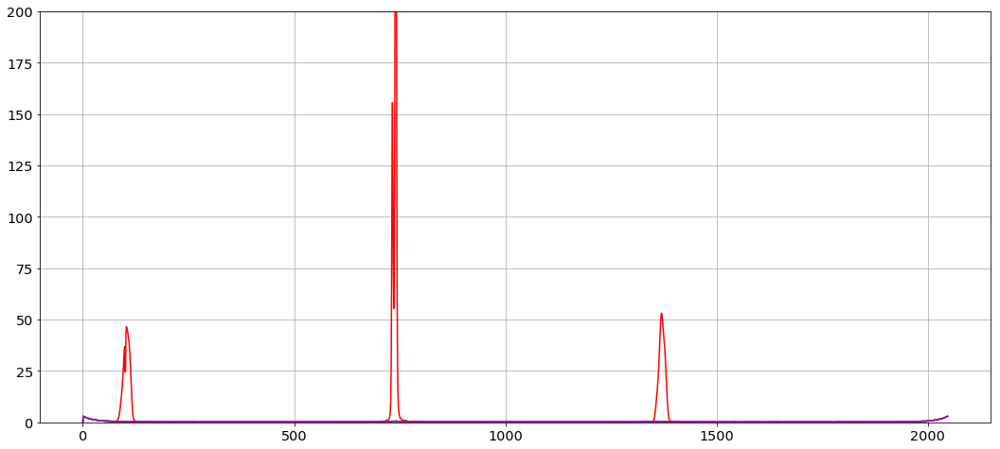

In [39]:
sel=1
plt.figure(figsize=(18,8))
plt.plot(thespectra[sel],'r-') 
plt.plot(Clean_Up[sel],'b-') 
plt.plot(Clean_Do[sel],'g-')
plt.plot(Clean_Av[sel],'m-')
plt.grid(True)
plt.ylim(0,200.)

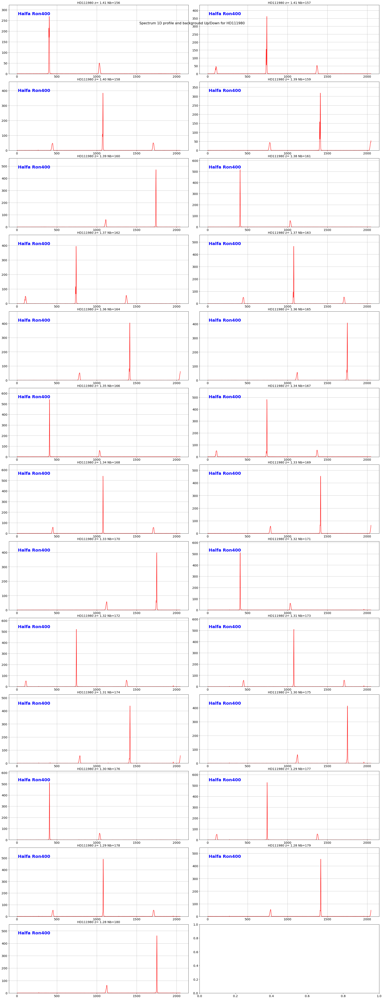

In [40]:
thecorrspectra=CorrectSpectrumFromBackground(thespectra,Clean_Av)

ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=2)
figfilename=os.path.join(dir_top_images,'correctedspectrum_profile.pdf')
plt.savefig(figfilename) 

# Grating characterisation

Halfa Ron400:	 gaussian center x=402.14+/-0.24
Halfa Ron400:	 gaussian center x=740.77+/-0.18
Halfa Ron400:	 gaussian center x=1076.93+/-0.14
Halfa Ron400:	 gaussian center x=1412.29+/-0.23
Halfa Ron400:	 gaussian center x=1741.78+/-0.03
Halfa Ron400:	 gaussian center x=405.74+/-0.02
Halfa Ron400:	 gaussian center x=741.11+/-0.13
Halfa Ron400:	 gaussian center x=1078.76+/-0.08
Halfa Ron400:	 gaussian center x=1413.52+/-0.09
Halfa Ron400:	 gaussian center x=1750.63+/-0.09
Halfa Ron400:	 gaussian center x=407.04+/-0.02
Halfa Ron400:	 gaussian center x=742.35+/-0.04
Halfa Ron400:	 gaussian center x=1078.32+/-0.02
Halfa Ron400:	 gaussian center x=1415.50+/-0.07
Halfa Ron400:	 gaussian center x=1751.53+/-0.08
Halfa Ron400:	 gaussian center x=406.55+/-0.02
Halfa Ron400:	 gaussian center x=743.98+/-0.02
Halfa Ron400:	 gaussian center x=1079.53+/-0.03
Halfa Ron400:	 gaussian center x=1416.07+/-0.05
Halfa Ron400:	 gaussian center x=1752.52+/-0.04
Halfa Ron400:	 gaussian center x=406.42+/-0.02
H

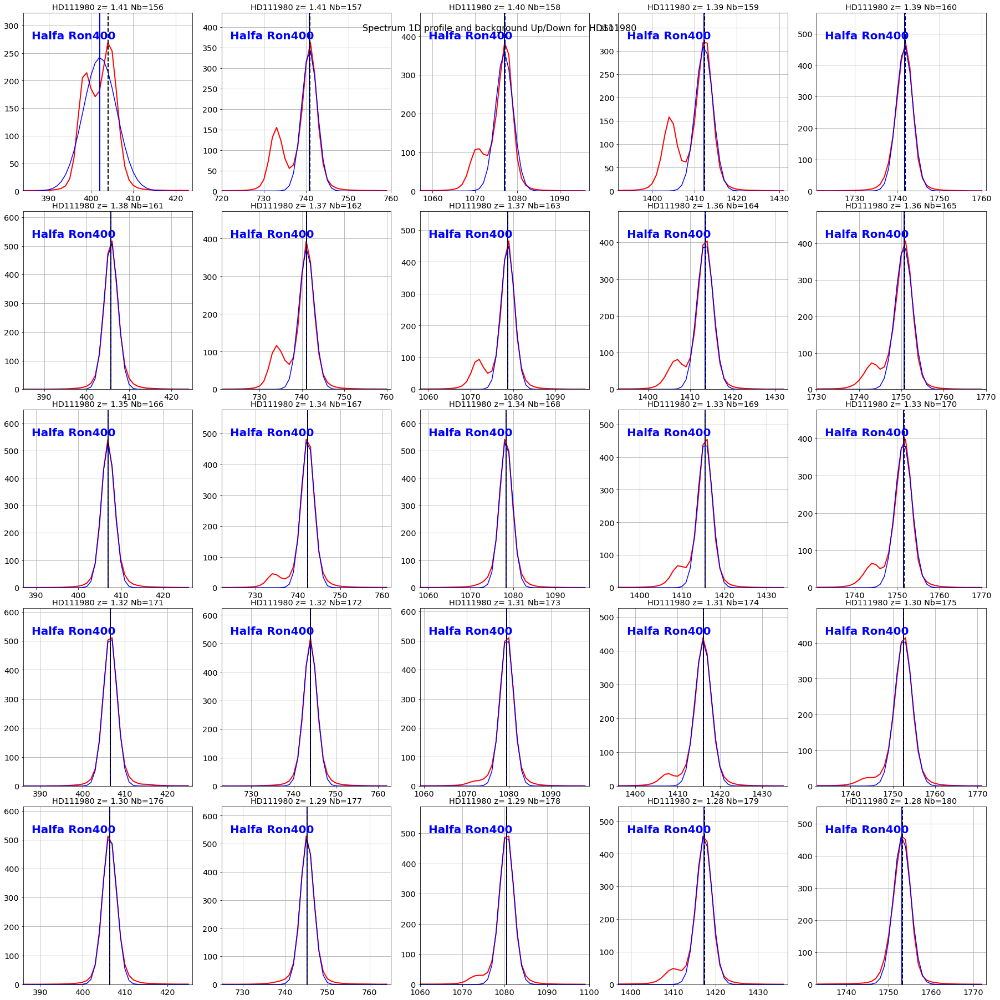

In [41]:
# Zero order profile
xlims_zero = []
for x in x_star :
    xlims_zero.append([x-20,x+20])
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                       xlim=xlims_zero,guess=[10,800,100],vertical_lines=x_star)
print 'CCDPROC star centers:'
print x_star

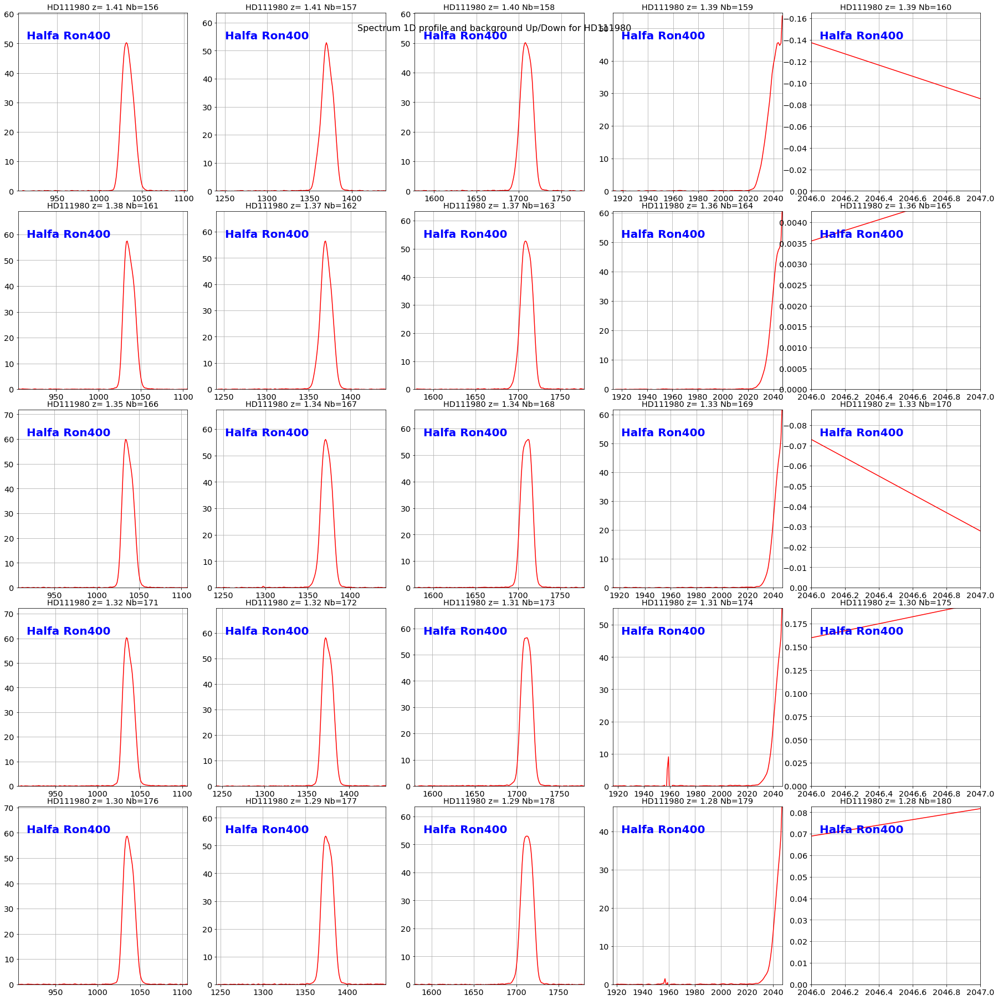

In [42]:
# Right spectrum profile
right_edge = thecorrspectra[0].shape[0]
xlims_right = []
for x in x_guess_right :
    if x == right_edge-1 :
        xlims_right.append([IMSIZE-2,IMSIZE-1])
    else :
        xlims_right.append([max(1,min(right_edge-2,int(x-100))),min(right_edge-1,int(x+100))])
ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,xlim=xlims_right)

Halfa Ron400:	 gaussian center x=1033.25+/-0.05
Halfa Ron400:	 gaussian center x=1371.09+/-0.04
Halfa Ron400:	 gaussian center x=1709.12+/-0.05
Halfa Ron400:	 gaussian center x=2044.42+/-0.05
Halfa Ron400:	 gaussian center x=1036.09+/-0.07
Halfa Ron400:	 gaussian center x=1370.73+/-0.03
Halfa Ron400:	 gaussian center x=1710.27+/-0.05
Halfa Ron400:	 gaussian center x=2045.54+/-0.06
Halfa Ron400:	 gaussian center x=1036.65+/-0.07
Halfa Ron400:	 gaussian center x=1372.23+/-0.04
Halfa Ron400:	 gaussian center x=1710.20+/-0.06
Halfa Ron400:	 gaussian center x=2047.35+/-0.07
Halfa Ron400:	 gaussian center x=1036.10+/-0.06
Halfa Ron400:	 gaussian center x=1374.30+/-0.06
Halfa Ron400:	 gaussian center x=1711.32+/-0.05
Halfa Ron400:	 gaussian center x=2048.00+/-0.79
Halfa Ron400:	 gaussian center x=1036.57+/-0.06
Halfa Ron400:	 gaussian center x=1376.23+/-0.06
Halfa Ron400:	 gaussian center x=1712.91+/-0.06
Halfa Ron400:	 gaussian center x=2049.31+/-0.33


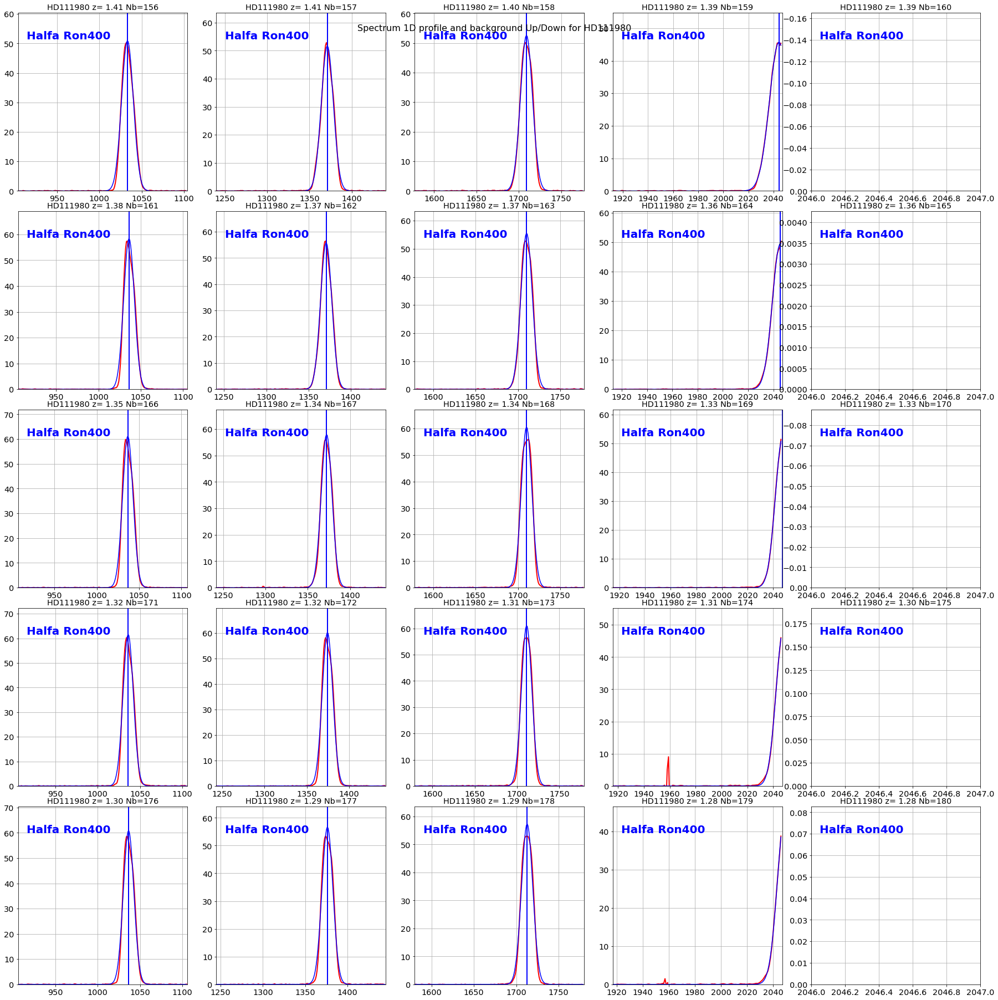

In [43]:
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                            xlim=xlims_right,guess=[10,1320,50])
figfilename=os.path.join(dir_top_images,'correctedspectrum_rightprofile2.pdf')
plt.savefig(figfilename)  

Halfa Ron400:	 gaussian center x=104.40+/-0.12
Halfa Ron400:	 gaussian center x=442.75+/-0.08
Halfa Ron400:	 gaussian center x=778.20+/-0.08
Halfa Ron400:	 gaussian center x=1111.68+/-0.10
Halfa Ron400:	 gaussian center x=106.10+/-0.09
Halfa Ron400:	 gaussian center x=445.75+/-0.07
Halfa Ron400:	 gaussian center x=782.06+/-0.08
Halfa Ron400:	 gaussian center x=1120.32+/-0.11
Halfa Ron400:	 gaussian center x=108.93+/-0.07
Halfa Ron400:	 gaussian center x=447.23+/-0.08
Halfa Ron400:	 gaussian center x=785.17+/-0.07
Halfa Ron400:	 gaussian center x=1121.78+/-0.09
Halfa Ron400:	 gaussian center x=110.67+/-0.06
Halfa Ron400:	 gaussian center x=448.10+/-0.06
Halfa Ron400:	 gaussian center x=786.04+/-0.09
Halfa Ron400:	 gaussian center x=1123.42+/-0.09
Halfa Ron400:	 gaussian center x=111.59+/-0.07
Halfa Ron400:	 gaussian center x=448.38+/-0.06
Halfa Ron400:	 gaussian center x=786.55+/-0.09
Halfa Ron400:	 gaussian center x=1123.90+/-0.10


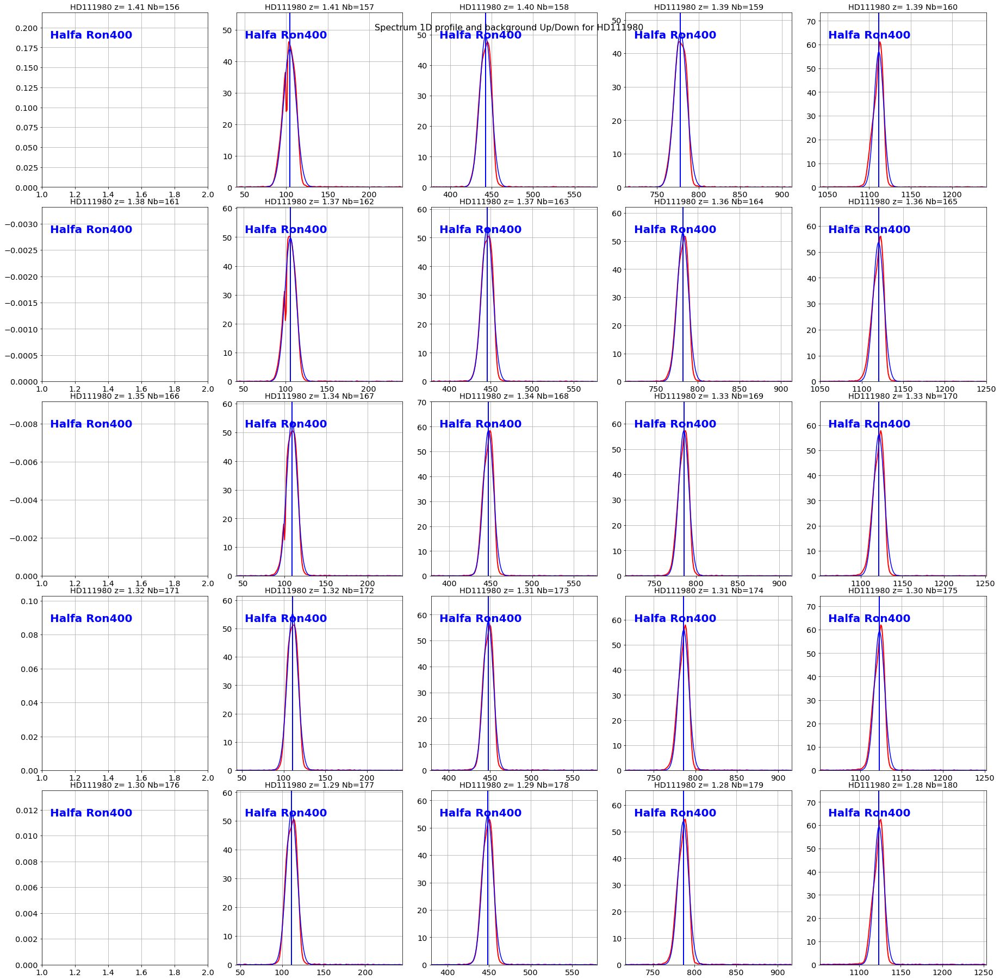

In [44]:
# Left profile
right_edge = thecorrspectra[0].shape[0]
xlims_left = []
for x in x_guess_left :
    if x == 1 :
        xlims_left.append([1,2])
    else :
        xlims_left.append([max(1,min(right_edge-2,int(x-100))),min(right_edge-1,int(x+100))])
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                            xlim=xlims_left,guess=[1,200,50])
figfilename=os.path.join(dir_top_images,'correctedspectrum_leftprofile2.pdf')
plt.savefig(figfilename)  

Present distance to CCD : 55.45 mm (to update if necessary)
-------------------------------
Halfa Ron400
Position of the H-alpha emission line : 629.24 +/- 0.05 pixels (0.01 percent) std: 6.97 pixels
Deduced distance to CCD with Halfa Ron400 : 55.58 +/- 0.15 mm (0.27 percent)
-------------------------------
Halfa Ron400
Position of the H-alpha emission line : 630.25 +/- 0.04 pixels (0.01 percent) std: 7.15 pixels
Deduced distance to CCD with Halfa Ron400 : 55.64 +/- 0.15 mm (0.27 percent)
-------------------------------
Halfa Ron400
Position of the H-alpha emission line : 632.00 +/- 0.05 pixels (0.01 percent) std: -7.11 pixels
Deduced distance to CCD with Halfa Ron400 : 55.78 +/- 0.15 mm (0.27 percent)
-------------------------------
Halfa Ron400
Position of the H-alpha emission line : 631.99 +/- 0.05 pixels (0.01 percent) std: 7.63 pixels
Deduced distance to CCD with Halfa Ron400 : 55.76 +/- 0.15 mm (0.27 percent)
-------------------------------
Halfa Ron400
Position of the H-alpha em

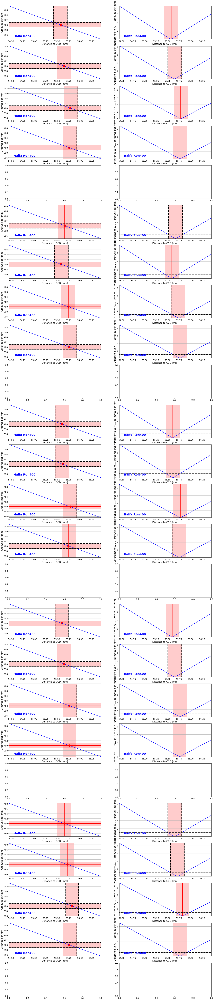

Present distance to CCD : 55.45 mm (to update if necessary)
-------------------------------
Halfa Ron400
Position of the H-alpha emission line : -636.44 +/- 0.12 pixels (-0.02 percent) std: 7.70 pixels
Deduced distance to CCD with Halfa Ron400 : 56.17 +/- 0.14 mm (0.25 percent)
-------------------------------
Halfa Ron400
Position of the H-alpha emission line : -634.37 +/- 0.08 pixels (-0.01 percent) std: 7.17 pixels
Deduced distance to CCD with Halfa Ron400 : 56.01 +/- 0.15 mm (0.27 percent)
-------------------------------
Halfa Ron400
Position of the H-alpha emission line : -634.23 +/- 0.08 pixels (-0.01 percent) std: 7.61 pixels
Deduced distance to CCD with Halfa Ron400 : 56.01 +/- 0.15 mm (0.27 percent)
-------------------------------
Halfa Ron400
Position of the H-alpha emission line : -630.19 +/- 0.10 pixels (-0.02 percent) std: -5.81 pixels
Deduced distance to CCD with Halfa Ron400 : 55.66 +/- 0.14 mm (0.25 percent)
-------------------------------
Halfa Ron400
Position of the H-

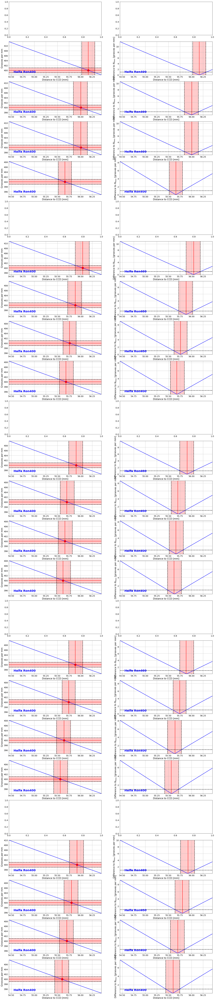

-------------------------------
Average distance to CCD : 55.75 +/- 0.15 mm (0.27 percent)


In [45]:
guess = [1,1320,50]
distance_rightorder, distance_rightorder_err, distances = CalibrateDistance2CCD_OneOrder(thecorrspectra,
                            x_star,order0_positions,all_filt,xlims_right,guess,order=1)

guess=[10,200,100]
distance_leftorder, distance_leftorder_err, distances = CalibrateDistance2CCD_OneOrder(thecorrspectra,
                            x_star,order0_positions,all_filt,xlims_left,guess,order=-1)

print '-------------------------------'  
distance_mean = np.mean([distance_rightorder,distance_leftorder])
distance_mean_err = np.sqrt(np.mean(np.array([distance_rightorder_err,distance_leftorder_err])**2))
print 'Average distance to CCD : %.2f +/- %.2f mm (%.2f percent)' % (distance_mean,distance_mean_err,100*distance_mean_err/distance_mean)

The DISTANCE2CCD value shifts in opposite way accross the images if we use the right or left order spectra. It meens that the uncertainty comes from the position of the star center along the x axis. The determinantion with both orders can remove this effect.

Present distance to CCD : 55.45 mm (to update if necessary)
-------------------------------
Halfa Ron400
Position of the H-alpha emission line : 633.35 +/- 0.06 pixels (0.01 percent)
Deduced distance to CCD with Halfa Ron400 : 55.90 +/- 0.15 mm (0.27 percent)
-------------------------------
Halfa Ron400
Position of the H-alpha emission line : 633.18 +/- 0.04 pixels (0.01 percent)
Deduced distance to CCD with Halfa Ron400 : 55.88 +/- 0.15 mm (0.27 percent)
-------------------------------
Halfa Ron400
Position of the H-alpha emission line : 633.11 +/- 0.05 pixels (0.01 percent)
Deduced distance to CCD with Halfa Ron400 : 55.88 +/- 0.15 mm (0.27 percent)
-------------------------------
Halfa Ron400
Position of the H-alpha emission line : 632.32 +/- 0.05 pixels (0.01 percent)
Deduced distance to CCD with Halfa Ron400 : 55.82 +/- 0.15 mm (0.27 percent)
-------------------------------
Halfa Ron400
Position of the H-alpha emission line : 632.26 +/- 0.04 pixels (0.01 percent)
Deduced distance 

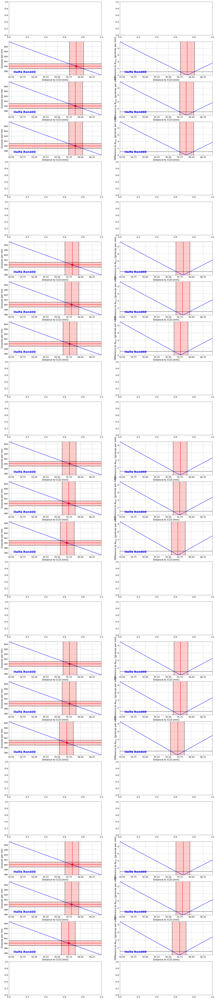

In [46]:
distance_mean, distance_mean_err, distances = CalibrateDistance2CCD_TwoOrder(thecorrspectra,all_filt,
    leftorder_edges=xlims_left,rightorder_edges=xlims_right,guess=[[10,200,200],[1,1320,50]],bounds=(-np.inf,np.inf))

### Conclusion on DISTANCE2CCD

The Thor300 gratings was mounted on the same plastic frame as the holograms, thus the DISTANCE2CCD is expected to closer to the reality for those. The Ron400 H-ampha peaks are unforcused. The Thor300 +1 and -1 orders are well focused then we use the Thor300 TwoOrder method to fix DISTANCE2CCD.

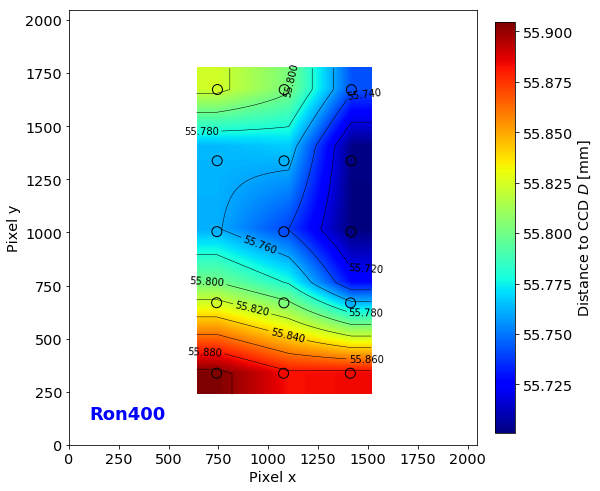

In [54]:
margin = 100

y = []
x = []
d = []
for k in range(len(distances)):
    if np.isnan(distances[k]) : continue
    y.append((order0_positions.T)[1][k])
    x.append((order0_positions.T)[0][k])
    d.append(distances[k])
xx,yy,z,interp = scatter_interpol(np.array([x,y]).T,d,margin=margin,kind='linear')

fig = plt.figure(figsize=(8,8))
plt.scatter(x, y, c=d, s=100, cmap=cm.jet, marker='o', vmin=np.min(d), vmax=np.max(d),edgecolors='k')
im = plt.imshow(z, extent=[np.min(x)-margin, np.max(x)+margin, np.min(y)-margin, np.max(y)+margin],origin='lower',aspect='auto',cmap=cm.jet)
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.annotate(holo_name,xy=(0.05,0.05),xytext=(0.05,0.05),horizontalalignment='left',
             verticalalignment='bottom',fontweight='bold',color='blue',fontsize=18,xycoords='axes fraction')
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])

#xx,yy,z,interp = scatter_interpol(np.array([y,x]).T,d,margin=margin)
CS = plt.contour(xx,yy,z,10,linewidths=0.5,colors='k')
plt.clabel(CS, inline=1, fontsize=10)

cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
#cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Distance to CCD $D$ [mm]') #,fontsize=16)

plt.show()

## Resolution of the holograms

With the +1 order

In [48]:
guess = [1,1320,50]
N_rightorder, N_rightorder_err = GratingResolution_OneOrder(thecorrspectra,
                                        x_star,order0_positions,all_images,all_filt,xlims_right,guess,order=+1)

H-alpha filter center: 655.9nm 
H-alpha filter width: 6.4nm

Halfa Ron400
N=400.8 +/- 1.3 lines/mm	 H-alpha FWHM=16.4pix with res=0.823nm/pix : FWHM=13.5nm	 ie finesse=92.3
Transverse profile FWHM=5.7pix 
-------------------------------
Halfa Ron400
N=401.3 +/- 1.3 lines/mm	 H-alpha FWHM=16.8pix with res=0.686nm/pix : FWHM=11.6nm	 ie finesse=127.0
Transverse profile FWHM=5.8pix 
-------------------------------
Halfa Ron400
N=402.3 +/- 1.3 lines/mm	 H-alpha FWHM=16.7pix with res=0.559nm/pix : FWHM=9.4nm	 ie finesse=221.8
Transverse profile FWHM=5.7pix 
-------------------------------
Halfa Ron400
N=402.1 +/- 1.3 lines/mm	 H-alpha FWHM=18.0pix with res=0.452nm/pix : FWHM=8.1nm	 ie finesse=381.8
Transverse profile FWHM=6.4pix 
-------------------------------
Halfa Ron400
N=401.5 +/- 1.3 lines/mm	 H-alpha FWHM=14.8pix with res=0.820nm/pix : FWHM=12.2nm	 ie finesse=113.7
Transverse profile FWHM=5.5pix 
-------------------------------
Halfa Ron400
N=400.9 +/- 1.3 lines/mm	 H-alpha FWHM=15.7p

With the two orders

In [49]:
Ns, N_errs = GratingResolution_TwoOrder(thecorrspectra,all_images,all_filt,
                        leftorder_edges=xlims_left,rightorder_edges=xlims_right,guess=[[10,200,100],[1,1320,50]])

H-alpha filter center: 655.9nm 
H-alpha filter width: 6.4nm

Halfa Ron400
N=403.1 +/- 1.3 lines/mm
Right order: H-alpha FWHM=16.8pix with res=0.963nm/pix : FWHM=16.2nm	 ie finesse=66.7
Left  order: H-alpha FWHM=18.1pix with res=0.963nm/pix : FWHM=17.5nm	 ie finesse=59.3
Transverse profile FWHM :  5.8pix (right)  6.2pix (left)
-------------------------------
Halfa Ron400
N=403.0 +/- 1.3 lines/mm
Right order: H-alpha FWHM=16.7pix with res=0.964nm/pix : FWHM=16.1nm	 ie finesse=67.4
Left  order: H-alpha FWHM=16.9pix with res=0.964nm/pix : FWHM=16.3nm	 ie finesse=66.4
Transverse profile FWHM :  5.7pix (right)  6.0pix (left)
-------------------------------
Halfa Ron400
N=402.9 +/- 1.3 lines/mm
Right order: H-alpha FWHM=18.0pix with res=0.964nm/pix : FWHM=17.3nm	 ie finesse=60.0
Left  order: H-alpha FWHM=17.9pix with res=0.964nm/pix : FWHM=17.3nm	 ie finesse=60.3
Transverse profile FWHM :  6.4pix (right)  5.9pix (left)
-------------------------------
Halfa Ron400
N=402.5 +/- 1.3 lines/mm
Righ

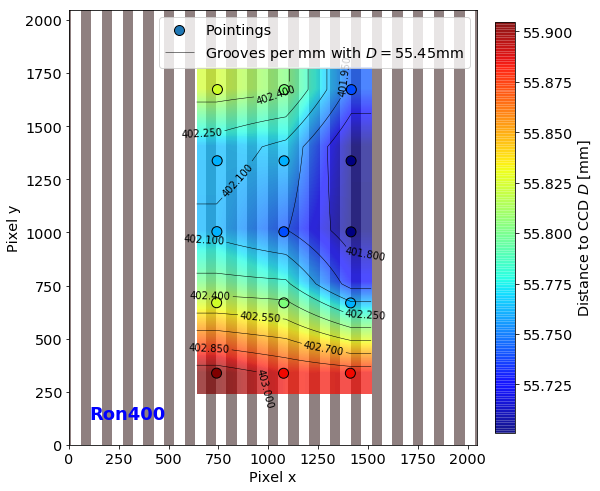

In [55]:
margin = 100

y = []
x = []
d = []
N = []
for k in range(len(distances)):
    if np.isnan(distances[k]) : continue
    y.append((order0_positions.T)[1][k])
    x.append((order0_positions.T)[0][k])
    d.append(distances[k])
    N.append(Ns[k])
xx,yy,z,interp = scatter_interpol(np.array([x,y]).T,d,margin=margin,kind='linear')

G= Grating(400,label=holo_name)
ronchi = build_ronchi(G.plate_center[0],G.plate_center[1],G.theta_tilt,grooves=0.4)

fig = plt.figure(figsize=(8,8))

plt.imshow(ronchi,origin='lower', alpha=0.5, cmap=cm.pink)

plt.scatter(x, y, c=d, s=100, cmap=cm.jet, marker='o', vmin=np.min(d), vmax=np.max(d),edgecolors='k',label='Pointings')
im = plt.imshow(z, extent=[np.min(x)-margin, np.max(x)+margin, np.min(y)-margin, np.max(y)+margin],origin='lower',aspect='auto',alpha=0.7,cmap=cm.jet)
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.annotate(holo_name,xy=(0.05,0.05),xytext=(0.05,0.05),horizontalalignment='left',
             verticalalignment='bottom',fontweight='bold',color='blue',fontsize=18,xycoords='axes fraction')
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])

xx,yy,z,interp = scatter_interpol(np.array([x,y]).T,N,margin=margin,kind='linear')
CS = plt.contour(xx,yy,z,10,linewidths=0.5,colors='k',label='Grooves per mm')
plt.clabel(CS, inline=1, fontsize=10)
labels = ['Grooves per mm with $D=%.4g$mm' % DISTANCE2CCD]
for i in range(len(labels)):
    CS.collections[i].set_label(labels[i])


cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
#cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Distance to CCD $D$ [mm]') #,fontsize=16)
plt.legend()
plt.show()

## Save grating resolution

In [51]:
N = []
Nerr = []
for k in range(len(Ns)):
    if np.isnan(Ns[k]): continue
    N.append(Ns[k])
    Nerr.append(N_errs[k])
N_mean = np.mean(N)
N_mean_err = np.sqrt(np.mean(np.array(Nerr)**2))
print 'With distance to CCD = %.2f +/- %.2f mm' % (DISTANCE2CCD, DISTANCE2CCD_ERR)
print 'Average grooves per mm : %.2f +/- %.2f /mm (%.2f percent)' % (N_mean,N_mean_err,100*N_mean_err/N_mean)

dirname = "../../common_tools/data/"+holo_name
ensure_dir(dirname)
#print 'Save results in ',dirname
#np.savetxt(dirname+'/N.txt',[N_mean,N_mean_err])

With distance to CCD = 55.45 +/- 0.19 mm
Average grooves per mm : 402.29 +/- 1.28 /mm (0.32 percent)


## Save spectra

In [52]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[2]
    short_partfilename=re.findall('^rotimg_(.*)',short_infilename)
    short_outfilename='finalSpectra_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=thecorrspectra[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,clobber=True)
    
!ls -l spectrum_fitsspec

total 3200
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:32 finalSpectra_20170609_156.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:32 finalSpectra_20170609_157.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:32 finalSpectra_20170609_158.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:32 finalSpectra_20170609_159.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:32 finalSpectra_20170609_160.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:32 finalSpectra_20170609_161.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:32 finalSpectra_20170609_162.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:32 finalSpectra_20170609_163.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:32 finalSpectra_20170609_164.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:32 finalSpectra_20170609_165.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:32 finalSpectra_20170609_166.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:32 finalSpectra_20170609_167.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû